## ADNI dataset: model for numerical data

### Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import f1_score, accuracy_score

# do not show warnings
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

### Dataset

#### General information

In [2]:
df = pd.read_csv("../data/df_ADNI_processed.csv")
df.head(3)

,Unnamed: 0,PTID,AGE,PTGENDER,APOE4,FDG,AV45,ABETA,TAU,PTAU,CDRSB,ADAS11,ADAS13,MMSE,RAVLT_immediate,Hippocampus,WholeBrain,Entorhinal,MidTemp,DX
0,0,011_S_0002,74.3,Male,0.0,1.36665,NaN,NaN,NaN,NaN,0.0,10.67,18.67,28.0,44.0,8336.0,1229740.0,4177.0,27936.0,CN
1,1,011_S_0003,81.3,Male,1.0,1.08355,NaN,741.5,239.7,22.83,4.5,22.00,31.00,20.0,22.0,5319.0,1129830.0,1791.0,18422.0,Dementia
2,5,022_S_0004,67.5,Male,0.0,NaN,NaN,1501.0,153.1,13.29,1.0,14.33,21.33,27.0,37.0,6869.0,1154980.0,3983.0,19615.0,MCI


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2155 entries, 0 to 2154
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       2155 non-null   int64  
 1   PTID             2155 non-null   object 
 2   AGE              2153 non-null   float64
 3   PTGENDER         2155 non-null   object 
 4   APOE4            2051 non-null   float64
 5   FDG              1355 non-null   float64
 6   AV45             1009 non-null   float64
 7   ABETA            1215 non-null   object 
 8   TAU              1215 non-null   object 
 9   PTAU             1215 non-null   object 
 10  CDRSB            2155 non-null   float64
 11  ADAS11           2138 non-null   float64
 12  ADAS13           2126 non-null   float64
 13  MMSE             2155 non-null   float64
 14  RAVLT_immediate  2138 non-null   float64
 15  Hippocampus      1492 non-null   float64
 16  WholeBrain       1692 non-null   float64
 17  Entorhinal    

Try to convert ABETA, TAU and PTAU into floats but an error is returnd. Check what causes the issue:

In [4]:
for i in df["TAU"]: # check for ABETA, TAU, PTAU
    if i=="NaN":
        pass
    else:
        try:
            i==float(i)
        except:
            print(i)

>1300
<80
<80
<80
<80


Values starting with "<" or ">" are substituted with the value fallowing the symbol (e.g. replace >120 with 120) to be abe to convert the string into a floating point:

In [5]:
# remove symbol and convert into float
for i in df["PTAU"]:
    if type(i)==str:
        if i.startswith(">") or i.startswith("<"):
            i = i.strip(">")
            i = i.strip("<")
            i = float(i)
            print(i)

120.0
8.0
8.0
8.0
8.0
8.0


In [6]:
df["PTAU"].replace("<8","8", inplace=True)
df["PTAU"].replace(">120","120", inplace=True)
df["ABETA"].replace("<200","200", inplace=True)
df["ABETA"].replace(">1700","1700", inplace=True)
df["TAU"].replace("<80","80", inplace=True)
df["TAU"].replace(">1300","1300", inplace=True)

In [7]:
df["ABETA"] = df["ABETA"].astype("float")
df["TAU"] = df["TAU"].astype("float")
df["PTAU"] = df["PTAU"].astype("float")

In [8]:
# number of unique entries for each column
for i in df:
    n = df[i].nunique()
    print(f"{i}: {n}")

Unnamed: 0: 2155
PTID: 2155
AGE: 335
PTGENDER: 2
APOE4: 3
FDG: 1330
AV45: 1004
ABETA: 949
TAU: 1036
PTAU: 1047
CDRSB: 18
ADAS11: 103
ADAS13: 140
MMSE: 14
RAVLT_immediate: 69
Hippocampus: 1265
WholeBrain: 1669
Entorhinal: 1159
MidTemp: 1379
DX: 3


In [9]:
# drop Unnamed column and PTID (no information)
df.drop(["Unnamed: 0","PTID"],axis=1,inplace=True)

In [10]:
# print the shape of the data
print('Number of observations: {}'.format(df.shape[0]))
print('Number of features:     {}'.format(df.shape[1]-1))

Number of observations: 2155
Number of features:     17


**Target**: DX

**Features**:
- continuous - AGE, FDG, AV45, ABETA, TAU, PTAU, ADAS11, ADAS13, RAVLT_immediate, Hippocampus, WholeBrain, Entorphinal, MidTemp 
- categorical - PTGENDER, APOE4, CDRSB, MMSE

In [11]:
# number of NaNs
df.isnull().sum()

AGE                   2
PTGENDER              0
APOE4               104
FDG                 800
AV45               1146
ABETA               940
TAU                 940
PTAU                940
CDRSB                 0
ADAS11               17
ADAS13               29
MMSE                  0
RAVLT_immediate      17
Hippocampus         663
WholeBrain          463
Entorhinal          687
MidTemp             687
DX                   33
dtype: int64

In [12]:
# drop all rows that have DX=NaN (since DX is the target)
df.dropna(subset=["DX"], inplace=True)

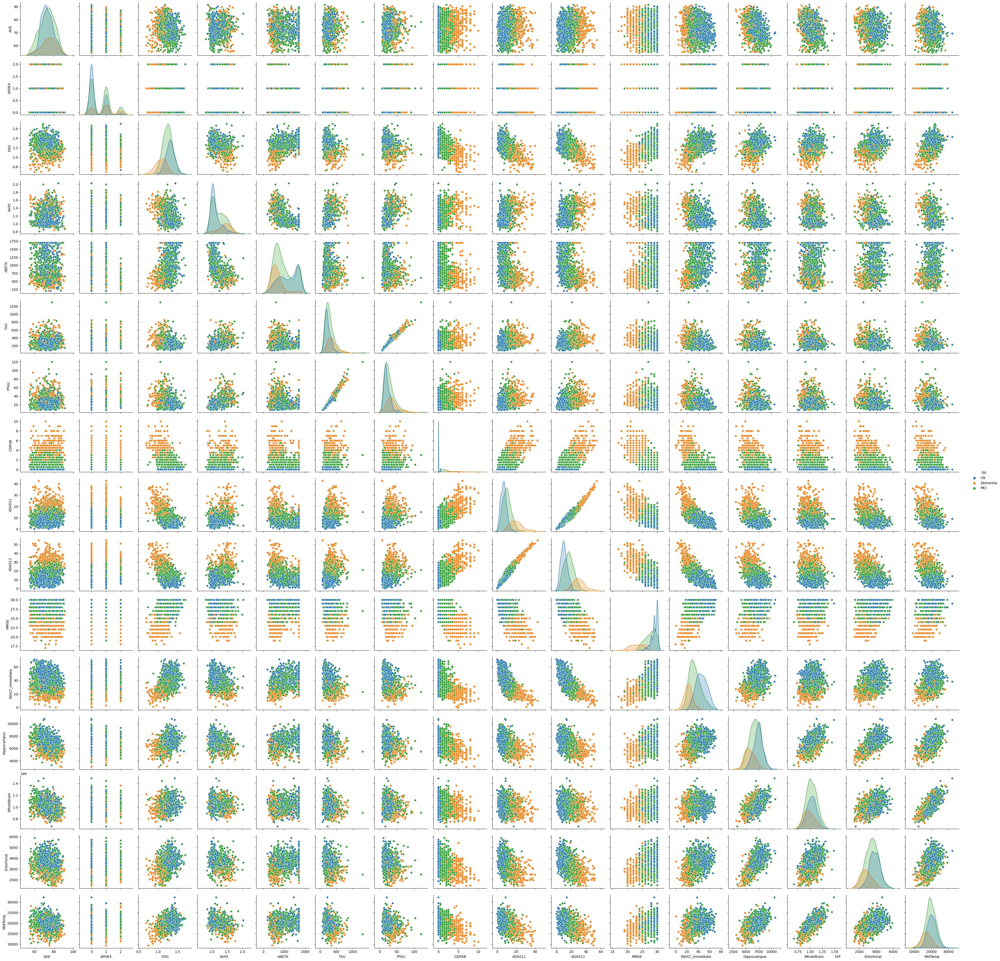

In [13]:
# overview plot of all the features
sns.pairplot(df, hue="DX");

Zoom-in of some of the plots, as examples:

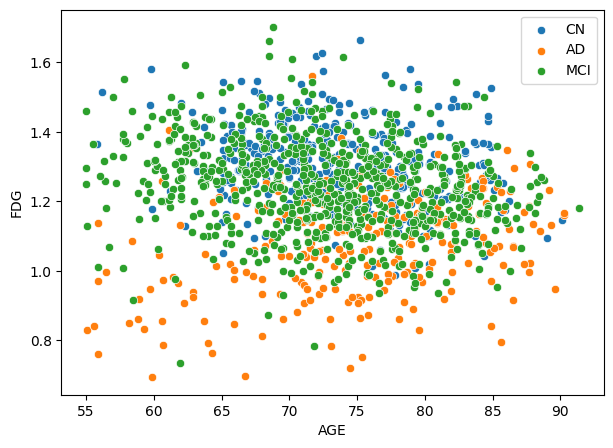

In [14]:
plt.subplots(figsize=(7, 5))
sns.scatterplot(data=df[df['DX'] == "CN"], x="AGE", y="FDG", label="CN")
sns.scatterplot(data=df[df['DX'] == "Dementia"], x="AGE", y="FDG", label="AD")
sns.scatterplot(data=df[df['DX'] == "MCI"], x="AGE", y="FDG", label="MCI")
plt.legend();

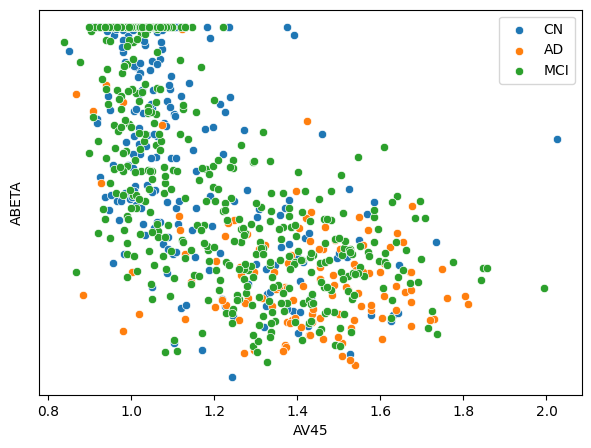

In [15]:
plt.subplots(figsize=(7, 5))
sns.scatterplot(data=df[df['DX'] == "CN"], x="AV45", y="ABETA", label="CN").set(yticklabels=[])
sns.scatterplot(data=df[df['DX'] == "Dementia"], x="AV45", y="ABETA", label="AD").set(yticklabels=[]) 
sns.scatterplot(data=df[df['DX'] == "MCI"], x="AV45", y="ABETA", label="MCI").set(yticklabels=[]) 
plt.tick_params(left=False)
plt.legend();

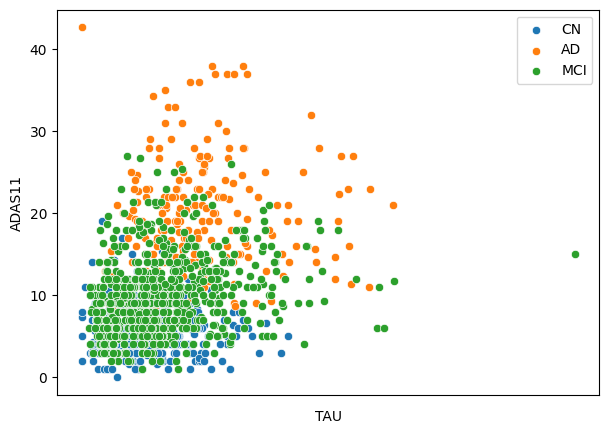

In [16]:
plt.subplots(figsize=(7, 5))
sns.scatterplot(data=df[df['DX'] == "CN"], x="TAU", y="ADAS11", label="CN").set(xticklabels=[])
sns.scatterplot(data=df[df['DX'] == "Dementia"], x="TAU", y="ADAS11", label="AD").set(xticklabels=[])
sns.scatterplot(data=df[df['DX'] == "MCI"], x="TAU", y="ADAS11", label="MCI").set(xticklabels=[])
plt.tick_params(bottom=False)
plt.legend();

#### Train and test split

Before doing further cleaning of the data, the dataset is split into train and test data, to avoid leakage of information.

In [17]:
# stratified train-test-split
df_train, df_test= train_test_split(df, test_size=0.25, random_state=42, stratify=df.DX)

In [18]:
# print shape of split datasets
print('Number of train data:    {}'.format(df_train.shape[0]))
print('Number of test data:     {}'.format(df_test.shape[0]))

Number of train data:    1591
Number of test data:     531


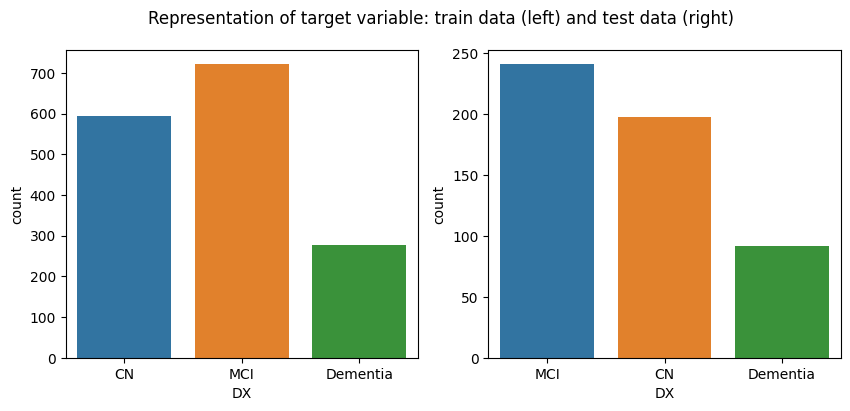

In [19]:
# visualize y_train and y_test
fig, axes = plt.subplots(1,2, figsize=(10, 4))
fig.suptitle("Representation of target variable: train data (left) and test data (right)")
sns.countplot(x=df_train.DX, ax=axes[0]);
sns.countplot(x=df_test.DX, ax=axes[1]);

#### Exploration and data cleaning

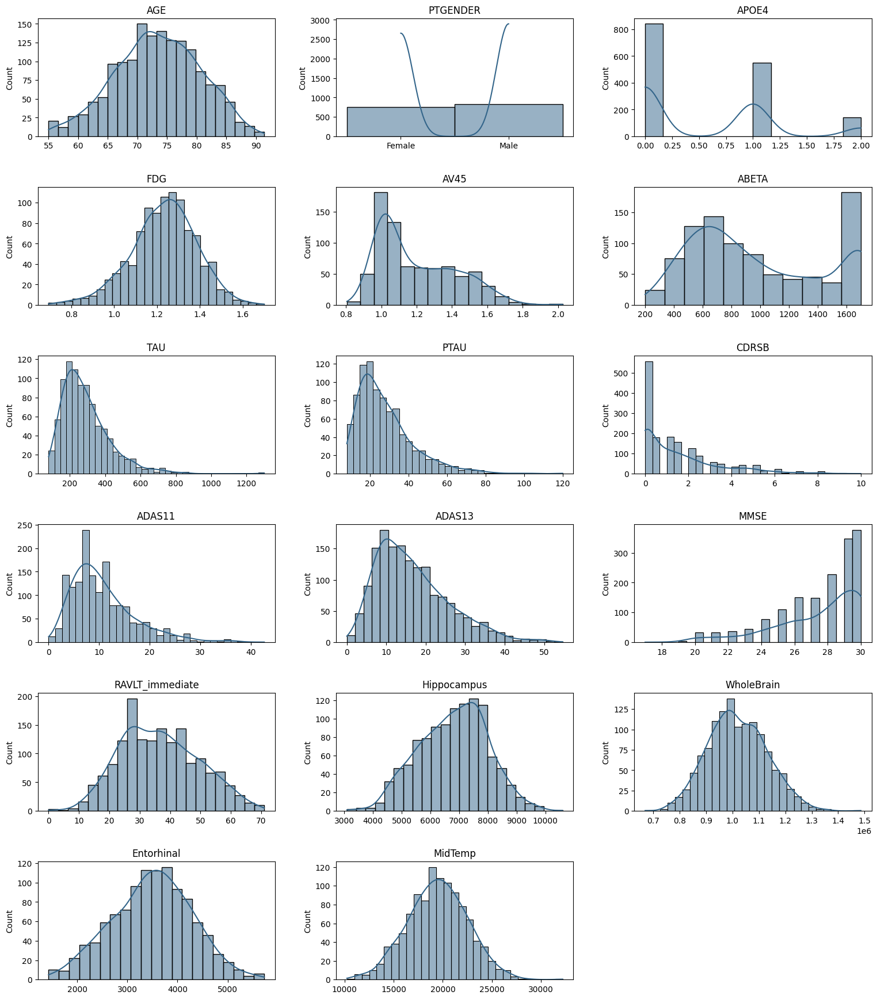

In [20]:
# distribution of features 
features = df_train.columns.tolist()
features.remove('DX')

fig,ax = plt.subplots(6,3,figsize=(16,18))
count = 0
for item in features:
    sns.histplot(df_train[item], kde=True, ax=ax[int(count/3)][count%3], color='#33658A').set(title=item, xlabel='')
    count += 1
ax.flat[-1].set_visible(False)
fig.tight_layout(pad=3)

From the distribution plots, ABETA has an innatural peak at 1700. This is caused by replacing all the >1700 values with 1700. Seeing the distribution, it is more reasonable to drop the ABETA column, also considering the high number of missing values.

In [21]:
# drop ABETA
df.drop("ABETA", axis=1, inplace=True)

In [22]:
# replace missing values with median of respective feature
df = df.fillna(df.median());